In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.util import random_noise
from skimage import feature

import shapely
import itertools
from collections import defaultdict
from shapely.geometry import LineString, Point

# Edge detection + Hough lines

### Tutorial links:
* Rubik's Code with Hough line detection: https://rubikscode.net/2022/06/13/thresholding-edge-contour-and-line-detection-with-opencv/
* canny edge detection from scikit: https://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html
* image to graph idea: https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.image.img_to_graph.html
* using different kernels: https://alyxion.github.io/Udacity_IntroToSelfDrivingCarsNd/8_1_Intro_Mini_Projects/41_Finding%20Edges%20and%20Custom%20Kernels.html


In [2]:
input_path = "../test_data/dendrogram_without_text.png"


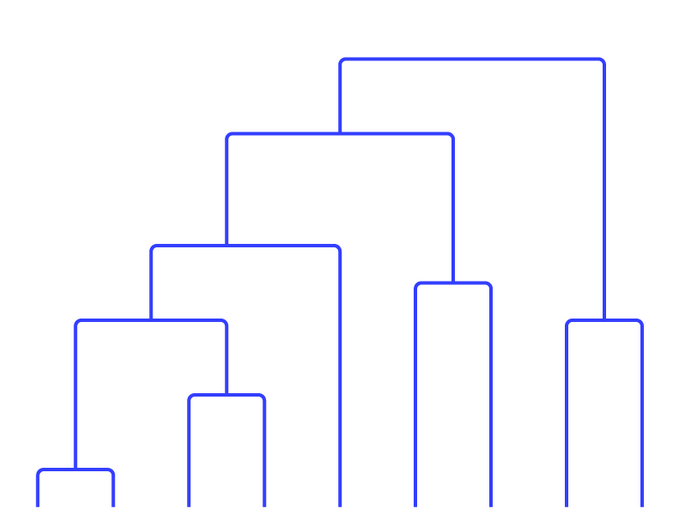

In [12]:
# read the image
image = cv2.imread(input_path)

#Convert an image from BGR to grayscale mode 
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  
#Convert a grayscale image to black and white using binary thresholding 
(thresh, BnW_image) = cv2.threshold(gray_image, 125, 255, cv2.THRESH_BINARY)

# Transform black and white image - MORE ELEGANT
BnW_image[BnW_image == 0] = 1
BnW_image[BnW_image == 255] = 0
BnW_image[BnW_image == 1] = 255

#display all the images
fig = px.imshow(image, title='Original image')
fig.show()

fig = px.imshow(gray_image, title="Gray image")
fig.show()

px.imshow(BnW_image, title="Black and white image")

# Plotting and postprocessing functions for Hough lines

In [13]:
def plot_lines(
    lines, 
    figsize=(10,6), 
    title="Edge detection with Hough lines",
):
    plt.figure(figsize=figsize)    
    for line in lines:
        x = [line[0], line[2]]
        y = [line[1], line[3]]
        plt.plot(x, y, 'b-')
    xmin, xmax, ymin, ymax = plt.axis()
    plt.ylim(ymax, ymin)
    plt.title(title)
    plt.show()
    
def plot_lines_and_intersections(
    lines, 
    intersections, 
    figsize=(10, 6), 
    legend=None,
    title="Hough lines + intersections"
):
    plt.figure(figsize=figsize)    
    for line in lines:
        x = [line[0], line[2]]
        y = [line[1], line[3]]
        plt.plot(x, y, 'b-')
    for i, point in enumerate(intersections):
        if legend:
            plt.plot(point[0], point[1], "o", label="Point " + str(i), markersize=10)
        else:
            plt.plot(point[0], point[1], "ro")
    xmin, xmax, ymin, ymax = plt.axis()
    plt.ylim(ymax, ymin)
    if legend:
        plt.legend()
    plt.title("Hough lines with intersections")
    plt.show()

In [14]:
def slope(line):
    x1, y1, x2, y2 = line
    if x1 == x2:
        return 0
    if y1 == y2: 
        return 1
    return (y2-y1)/(x2-x1)

def parallel(line1, line2):
    return slope(line1) == slope(line2)

def is_vertical(line, t=3):
    x1, y1, x2, y2 = line
    return abs(x1 - x2) <= t

def is_horizontal(line, t=3):
    x1, y1, x2, y2 = line
    return abs(y1 - y2) <= t

def get_length(line):
    x1, y1, x2, y2 = line
    return np.sqrt((x2-x1)**2+(y2-y1)**2)


In [17]:
def find_intersection(line1, line2):
    linestring1 = LineString([tuple(line1[:2]), tuple(line1[2:])])
    linestring2 = LineString([tuple(line2[:2]), tuple(line2[2:])])
    int_pt = linestring1.intersection(linestring2)
    if int_pt.is_empty:
        return 0
    else:
        return (int_pt.x, int_pt.y)
    

def find_all_intersections(lines):
    intersections = []
    for line_1, line_2 in itertools.combinations(lines,2):
        if (is_horizontal(line_1) and is_vertical(line_2)) or (is_horizontal(line_2) and is_vertical(line_1)):
            intersection = find_intersection(line_1, line_2)
            if intersection != 0:
                intersections.append(intersection)
    return intersections
            

def filter_intersections(intersections, t=2):
    """
    t - stands for treshold
    """
    filtered_intersections = []
    seen = defaultdict(lambda: False)
    print(f"Initial number of interesections = {len(intersections)}")
    
    for inter in intersections:
        if not seen[inter]:
            x, y = inter
            similar = [i for i in intersections if x - t <= i[0] <= x + t and y - t <= i[1] <= y + t]
            if similar:
                filtered_intersections.append(tuple(np.mean(similar, axis=0)))
            for similar_intersection in similar:
                seen[similar_intersection] = True
                
    print(f"After filtering number of interesections = {len(filtered_intersections)}")
    return filtered_intersections

# Full example

Example lines from Hough Lines = [[604 321 604  61]], number of lines = 59


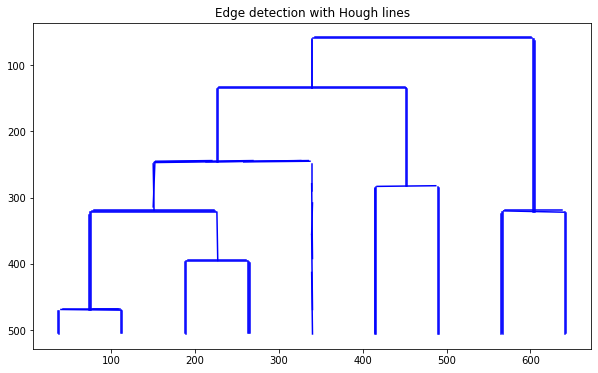

Number of intersections = 26


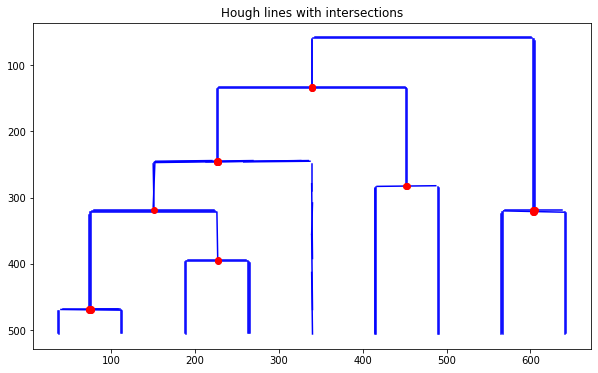

Initial number of interesections = 26
After filtering number of interesections = 7


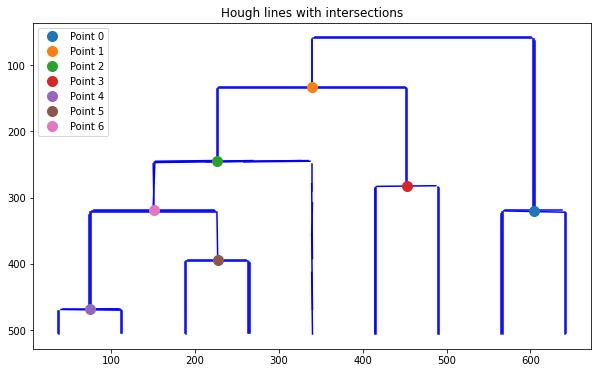

In [18]:
lines = cv2.HoughLinesP(BnW_image, 1, np.pi/180, 30, minLineLength=30, maxLineGap=20)
lines_list = []
for line in lines:
    lines_list.append(list(line[0]))

print(f"Example lines from Hough Lines = {lines[0]}, number of lines = {len(lines)}")
plot_lines(lines_list)

intersections = find_all_intersections(lines_list)
print(f"Number of intersections = {len(intersections)}")
plot_lines_and_intersections(lines_list, intersections)

filtered_intersections = filter_intersections(intersections, t=2)
plot_lines_and_intersections(lines_list, filtered_intersections, legend=True)

In [26]:
vertical_lines = [line for line in lines_list if is_vertical(line)]
# vertical_lines

In [45]:
def find_leaves(lines, intersections, t=5):
    n_leaves = len(intersections) + 2 # for now we don't have the root
    vertical_lines = [line for line in lines if is_vertical(line)]
    vertical_lines_sorted = sorted(vertical_lines, key = lambda x: max(x[1], x[3]), reverse=True)
    max_y = max(vertical_lines_sorted[0][1], vertical_lines_sorted[0][3])
    
    leaves_points, leaves_lines = [], []
    for line in vertical_lines_sorted:
        x1, y1, x2, y2 = line
        if abs(max(y1, y2)- max_y) <= t:
            leaves_lines.append(line)
            max_ind = np.argmax([y1, y2])*2
            point = (line[max_ind], max(y1, y2))
            leaves_points.append(point)
        else:
            break
    return leaves_lines, leaves_points

Initial number of interesections = 20
After filtering number of interesections = 9


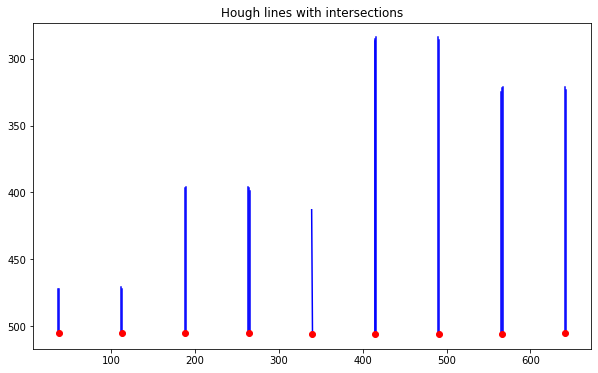

In [52]:
new_lines, new_points = find_leaves(lines_list, filtered_intersections)
filtered_leaves_points = filter_intersections(new_points)
# print(f"How many leaves = {len(filtered_leaves_points)}")
plot_lines_and_intersections(new_lines, filtered_leaves_points)

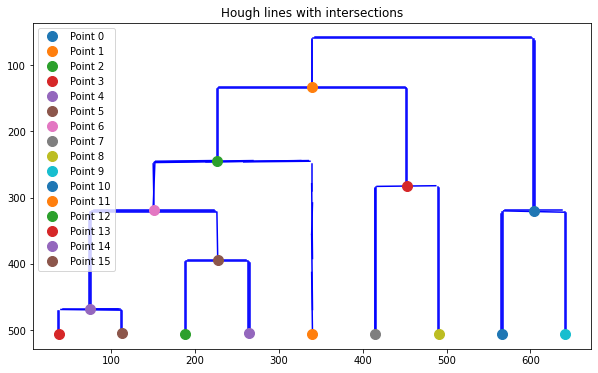

In [54]:
plot_lines_and_intersections(lines_list, filtered_intersections + filtered_leaves_points,
                             legend=True)

# Spróbować własnym kernelem
https://en.wikipedia.org/wiki/Line_detection